In [452]:
!pip install torch

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
import pandas as pd
import random
import geopandas as gpd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import seaborn as sns  # seaborn作为matplotlib的补充，导入后会覆盖matplotlib的默认作图风格

from torch.utils.data import TensorDataset, DataLoader, Subset
from sklearn.model_selection import StratifiedShuffleSplit
from livelossplot import PlotLosses
from sklearn.metrics import accuracy_score

In [2]:
def set_seed(seed):
    """
    Use this to set ALL the random seeds to a fixed value and take out any randomness from cuda kernels
    """
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.benchmark = True  ##uses the inbuilt cudnn auto-tuner to find the fastest convolution algorithms. -
    torch.backends.cudnn.enabled   = True

    return True

device = 'cpu'
if torch.cuda.device_count() > 0 and torch.cuda.is_available():
    print("Cuda installed! Running on GPU!")
    device = 'cuda'
else:
    print("No GPU available!")

No GPU available!


In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [4]:
import os
# injection data
inputdir = "data/yearly"
# inputdir = "datasets/OCC_injection_data/MonthlyInjectionRecords"
df = pd.DataFrame()

for root, dirnames, filenames in os.walk(inputdir):
    for filename in filenames:
        if ".csv" in filename:
            tmp_df = pd.read_csv(os.path.join(root, filename))
            print(len(tmp_df))
            df = df.append(tmp_df, ignore_index=True)

900
900
900
900
900
900
900
900


In [5]:
df

,injection_vol,injection_psi,injection_depth_sum,depth_to_basement,HF_number,HF_Base_Water_Volume,HF_Base_NoWater_Volume,earthquake_occurence
0,0.0,0.0,0.0,0.0,0,0.0,0.0,0
1,0.0,0.0,0.0,0.0,0,0.0,0.0,0
2,0.0,0.0,0.0,0.0,0,0.0,0.0,0
3,0.0,0.0,0.0,0.0,0,0.0,0.0,0
4,0.0,0.0,0.0,0.0,0,0.0,0.0,0
...,...,...,...,...,...,...,...,...
7195,0.0,0.0,0.0,0.0,0,0.0,0.0,0
7196,0.0,0.0,0.0,0.0,0,0.0,0.0,0
7197,0.0,0.0,0.0,0.0,0,0.0,0.0,0
7198,0.0,0.0,0.0,0.0,0,0.0,0.0,0


In [6]:
df.rename(columns = {"earthquake_occurence":"class"}, inplace=True)
df['class'].value_counts()
df.isnull().any()

injection_vol             False
injection_psi             False
injection_depth_sum       False
depth_to_basement         False
HF_number                 False
HF_Base_Water_Volume      False
HF_Base_NoWater_Volume    False
class                     False
dtype: bool

In [7]:
labels = df['class']

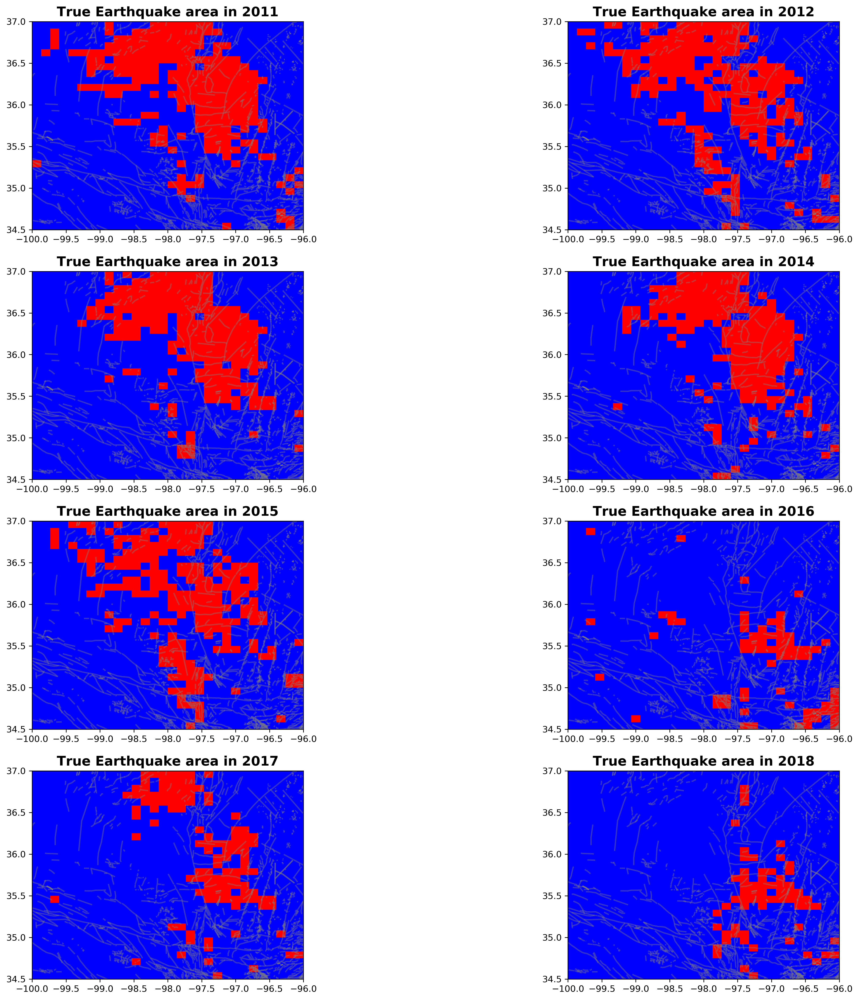

In [8]:
m = 31
n = 31
# m, n = (41, 41)
x = np.linspace(-100, -96, m)
y = np.linspace(34.5, 37, n)

X, Y = np.meshgrid(x, y)

fig = plt.figure(figsize=(20, 20), dpi=300)
ax = []
oklahoma_map = gpd.read_file('datasets/GeologicalData/Interpreted_faults/Interpretative.shp')
# 设置地图范围
lat = np.linspace(34.5, 37, m) # y
lon = np.linspace(-100, -96, n) # x

for i in range(0,8):
    ax.append(fig.add_subplot(4,2,i+1))
    oklahoma_map.plot(ax=ax[i], alpha=0.4,color='grey')
    plot_list = labels.values[i*900:i*900+900]
    # 从底到上，一行一行遍历
    j = 0
    for la_index in range(0, len(lat)-1):
        for lo_index in range(0, len(lon)-1):
    #         print(la_index, lo_index)
    #         grid = earthquake_df[(earthquake_df['latitude']>lat[la_index])&(earthquake_df['latitude']<lat[la_index+1])&(earthquake_df['longitude']>lon[lo_index])&(earthquake_df['longitude']<lon[lo_index+1])]
#             if j >= 900: pass    
            if plot_list[j] == 0:
                ax[i].fill_between([lon[lo_index], lon[lo_index+1]],lat[la_index],lat[la_index+1],facecolor='blue')
            else:
                ax[i].fill_between([lon[lo_index], lon[lo_index+1]],lat[la_index],lat[la_index+1],facecolor='red')
            j = j + 1
            
    ax[i].set_xlim(-100, -96)
    ax[i].set_ylim(34.5, 37)
    ax[i].set_title('True Earthquake area in '+str(2011+i), fontsize=15,fontweight='bold')
# add .shp mapfile to axes
# Load the shp file



# ax1.set_xlim(-100, -96)
# ax1.set_ylim(34.5, 37)
# ax1.set_title('True Earthquake area', fontsize=15,fontweight='bold')
# plt.xlim(-98, -97.5)
# plt.ylim(36.5, 37)
# show map
plt.show()

# 逐步回归分析

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

x_columns = df.columns.tolist()[:-1]

#特征features
X = df[x_columns]
#标签labels
Y = df['class']

X_train,X_test,y_train,y_test=train_test_split(X,Y,train_size=0.8, random_state=42)

#输出数据大小
print('原始数据特征：',X.shape,
     '训练数据特征：',X_train.shape,
      '测试数据特征',X_test.shape)

print('原始数据标签：',Y.shape,
     '训练数据标签：',y_train.shape,
      '测试数据标签',y_test.shape)

feature_number = len(x_columns)

#将训练数据特征转换成二维数组X行*1列
X_train=X_train.values.reshape(-1,feature_number)
#将测试数据特征转换成二维数组X行*1列
X_test=X_test.values.reshape(-1,feature_number)


#第一步：创建模型：逻辑回归
model=LogisticRegression()
#第二步：训练模型
model.fit(X_train,y_train)

#第三步: 评估模型：准确率
model.score(X_test,y_test)

原始数据特征： (7200, 7) 训练数据特征： (5760, 7) 测试数据特征 (1440, 7)
原始数据标签： (7200,) 训练数据标签： (5760,) 测试数据标签 (1440,)


0.8048611111111111

In [10]:
## creating function to get model statistics
def get_stats():
    x = df[x_columns]
    y = df['class']
    results = sm.OLS(y, x).fit()
    print(results.summary())

In [11]:
get_stats()

                                 OLS Regression Results                                
Dep. Variable:                  class   R-squared (uncentered):                   0.137
Model:                            OLS   Adj. R-squared (uncentered):              0.136
Method:                 Least Squares   F-statistic:                              190.3
Date:                Fri, 23 Jul 2021   Prob (F-statistic):                   9.22e-226
Time:                        22:54:00   Log-Likelihood:                         -3670.4
No. Observations:                7200   AIC:                                      7353.
Df Residuals:                    7194   BIC:                                      7394.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                             coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------

/Users/zhiyongliu/opt/anaconda3/lib/python3.7/site-packages/statsmodels/regression/linear_model.py:1860: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sqrt(eigvals[0]/eigvals[-1])


In [12]:
x_columns.remove("HF_Base_NoWater_Volume")
get_stats()

                                 OLS Regression Results                                
Dep. Variable:                  class   R-squared (uncentered):                   0.137
Model:                            OLS   Adj. R-squared (uncentered):              0.136
Method:                 Least Squares   F-statistic:                              190.3
Date:                Fri, 23 Jul 2021   Prob (F-statistic):                   9.22e-226
Time:                        22:54:00   Log-Likelihood:                         -3670.4
No. Observations:                7200   AIC:                                      7353.
Df Residuals:                    7194   BIC:                                      7394.
Df Model:                           6                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [13]:
x_columns.remove("HF_number")
get_stats()

                                 OLS Regression Results                                
Dep. Variable:                  class   R-squared (uncentered):                   0.137
Model:                            OLS   Adj. R-squared (uncentered):              0.136
Method:                 Least Squares   F-statistic:                              228.2
Date:                Fri, 23 Jul 2021   Prob (F-statistic):                   7.97e-227
Time:                        22:54:00   Log-Likelihood:                         -3670.7
No. Observations:                7200   AIC:                                      7351.
Df Residuals:                    7195   BIC:                                      7386.
Df Model:                           5                                                  
Covariance Type:            nonrobust                                                  
                           coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------

In [14]:
#特征features
X = df[x_columns]
#标签labels
Y = df['class']

X_train,X_test,y_train,y_test=train_test_split(X,Y,train_size=0.8, random_state=42)

#输出数据大小
print('原始数据特征：',X.shape,
     '训练数据特征：',X_train.shape,
      '测试数据特征',X_test.shape)

print('原始数据标签：',Y.shape,
     '训练数据标签：',y_train.shape,
      '测试数据标签',y_test.shape)

feature_number = len(x_columns)

#将训练数据特征转换成二维数组X行*1列
X_train=X_train.values.reshape(-1,feature_number)
#将测试数据特征转换成二维数组X行*1列
X_test=X_test.values.reshape(-1,feature_number)


#第一步：创建模型：逻辑回归
model=LogisticRegression()
#第二步：训练模型
model.fit(X_train,y_train)

#第三步: 评估模型：准确率
model.score(X_test,y_test)

原始数据特征： (7200, 5) 训练数据特征： (5760, 5) 测试数据特征 (1440, 5)
原始数据标签： (7200,) 训练数据标签： (5760,) 测试数据标签 (1440,)


0.8048611111111111

# 构建神经网络模型

In [15]:
x_columns

['injection_vol',
 'injection_psi',
 'injection_depth_sum',
 'depth_to_basement',
 'HF_Base_Water_Volume']

In [16]:
features = df[x_columns]
target = df['class']

In [17]:
# feature_names = df.columns.tolist()[:-1]

In [18]:
feature_names = features.columns.tolist()
print(feature_names)

['injection_vol', 'injection_psi', 'injection_depth_sum', 'depth_to_basement', 'HF_Base_Water_Volume']


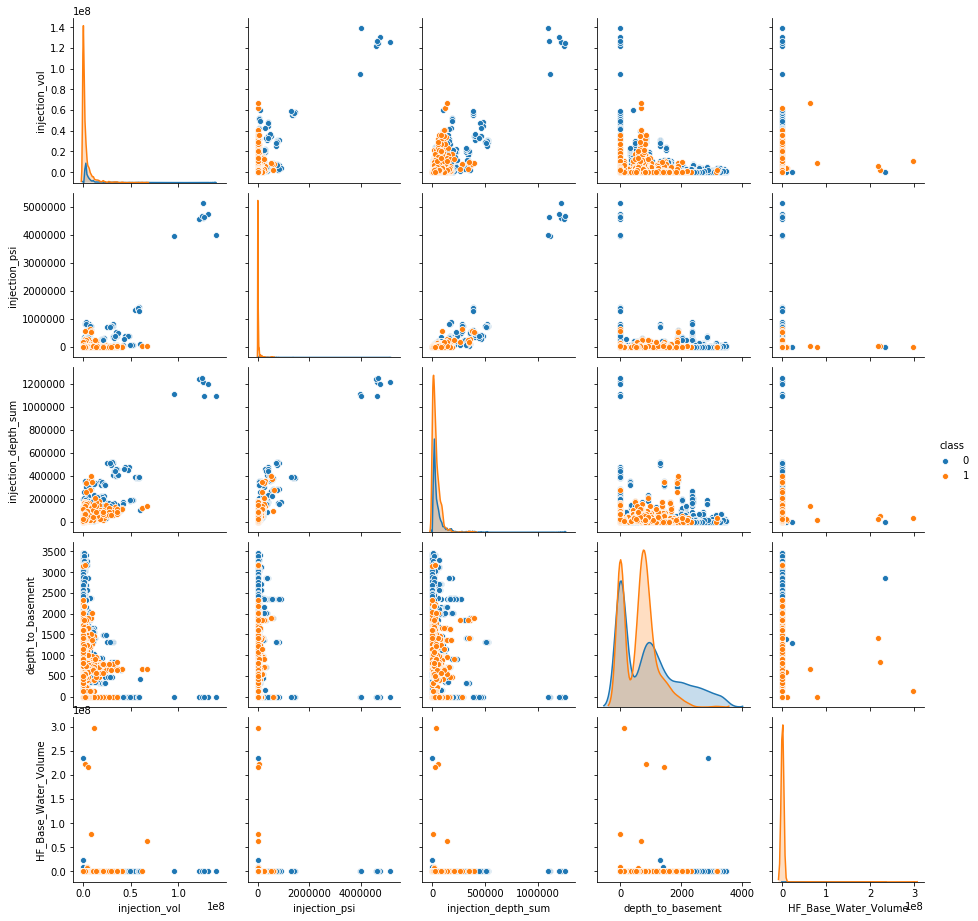

In [19]:
sns.pairplot(df, hue='class', vars=feature_names)  # hue : 使用指定变量为分类变量画图；vars : 与data使用，否则使用data的全部变量
plt.show()  # 仍然使用matplotlib的显示函数

In [20]:
# def normalize(df):
#     return (df - df.min()) / ( df.max() - df.min())

# features = normalize(features)

In [21]:
class Net(nn.Module):
    def __init__(self,n_input, n_output):
        super(Net,self).__init__()
        self.linear1 = nn.Linear(n_input, 12)
        self.sigmoid1 = nn.Sigmoid()
        self.linear2 = nn.Linear(12, 8)
        self.sigmoid2 = nn.Sigmoid()
        self.linear3 = nn.Linear(8, n_output)
#         self.softmax = nn.Softmax(dim=1)

    def forward(self, x):
        lin1_out = self.linear1(x)
        sigmoid_out1 = self.sigmoid1(lin1_out)
        sigmoid_out2 = self.sigmoid2(self.linear2(sigmoid_out1))
        return self.linear3(sigmoid_out2)

In [22]:
def train(model, optimizer, criterion, data_loader):
    """
    The training method, to train the dataset
    """
    model.train()
    train_loss, train_accuracy = 0, 0
    for X, y in data_loader:
        X, y = X.to(device), y.to(device)
        optimizer.zero_grad()
        a2 = model(X.view(-1, feature_number).float())
        loss = criterion(a2, y)
        loss.backward()
        train_loss += loss*X.size(0)
        y_pred = F.log_softmax(a2, dim=1).max(1)[1]
        train_accuracy += accuracy_score(y.cpu().numpy(), y_pred.detach().cpu().numpy())*X.size(0)
        optimizer.step()  
        
    return train_loss/len(data_loader.dataset), train_accuracy/len(data_loader.dataset)
  
def validate(model, criterion, data_loader):
    """
    The validation method, to validate and test
    """
    model.eval()
    validation_loss, validation_accuracy = 0., 0.
    for X, y in data_loader:
        with torch.no_grad():
            X, y = X.to(device), y.to(device)
            a2 = model(X.view(-1, feature_number).float())
            loss = criterion(a2, y)
            validation_loss += loss*X.size(0)
            y_pred = F.log_softmax(a2, dim=1).max(1)[1]
            validation_accuracy += accuracy_score(y.cpu().numpy(), y_pred.cpu().numpy())*X.size(0)
            
    return validation_loss/len(data_loader.dataset), validation_accuracy/len(data_loader.dataset)

In [23]:
# 测试模型是否可用
# x = torch.rand((100,feature_number))
# print(x)
# model = Net(feature_number,20,2)
# result = model(x)
# print (result)
# model = model.to(device)

# Train the model, validation and evaluation

In [44]:
# Define the hyperparameters
seed = 42
lr = 1e-2
momentum = 0.8
batch_size = 32
test_batch_size = 32
n_epochs = 100

feature_number = len(feature_names)
model = Net(feature_number,2)

In [45]:
Y = target.values
X = features.values
data_tensor = TensorDataset(torch.tensor(X), torch.tensor(Y))

shuffler = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=42).split(X, Y)
indices = [(train_idx, validation_idx) for train_idx, validation_idx in shuffler][0]
train_dataset = torch.utils.data.Subset(data_tensor, indices[0])
val_dataset = torch.utils.data.Subset(data_tensor, indices[1])

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [46]:
print(X)

[[0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 ...
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0.]]


In [47]:
print(Y.sum())

1354


In [48]:
print(len(train_dataset))
print(len(val_dataset))

5760
1440


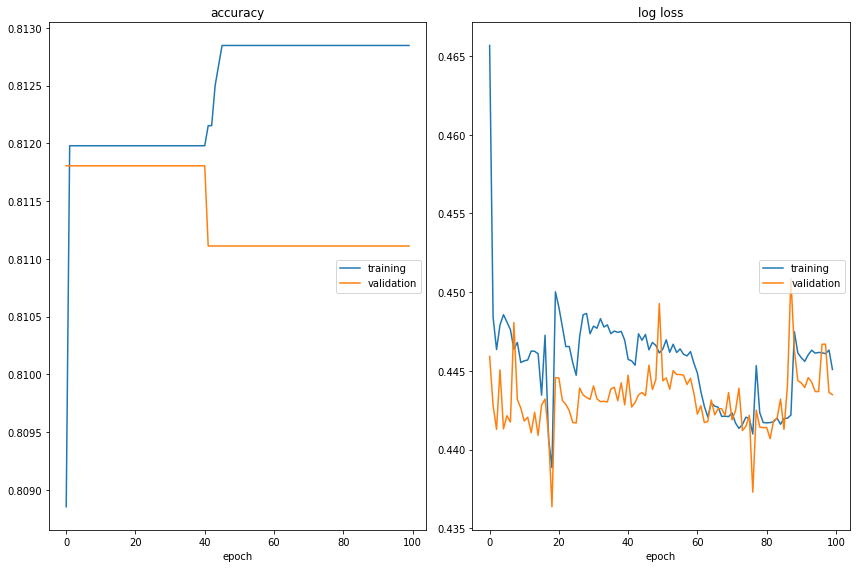

accuracy
	training         	 (min:    0.809, max:    0.813, cur:    0.813)
	validation       	 (min:    0.811, max:    0.812, cur:    0.811)
log loss
	training         	 (min:    0.439, max:    0.466, cur:    0.445)
	validation       	 (min:    0.436, max:    0.451, cur:    0.443)

Avg. Test Loss: 0.443  Avg. Test Accuracy: 0.811


In [49]:
set_seed(seed)
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
criterion = nn.CrossEntropyLoss()

liveloss = PlotLosses()
for epoch in range(n_epochs):
    logs = {}
    train_loss, train_accuracy = train(model, optimizer, criterion, train_loader)

    logs['' + 'log loss'] = train_loss.item()
    logs['' + 'accuracy'] = train_accuracy.item()

    validation_loss, validation_accuracy = validate(model, criterion, test_loader)
    logs['val_' + 'log loss'] = validation_loss.item()
    logs['val_' + 'accuracy'] = validation_accuracy.item()

    liveloss.update(logs)
    liveloss.draw()


test_loss, test_accuracy = validate(model, criterion, test_loader)  
print("")
print("Avg. Test Loss: %1.3f" % test_loss.item(), " Avg. Test Accuracy: %1.3f" % test_accuracy.item())

In [50]:
model.eval()
test_features = X[indices[1]]
test_labels = Y[indices[1]]
test_input_tensor = torch.from_numpy(test_features)
out_probs = model(test_input_tensor.float())
out_classes = F.log_softmax(out_probs, dim=1).max(1)[1].numpy()
# print(test_labels)
# print(out_classes)
print("Test Accuracy:", sum(out_classes == test_labels) / len(test_labels))

Test Accuracy: 0.8111111111111111


# Feature Importance

In [162]:
from captum.attr import FeaturePermutation, IntegratedGradients

# Helper method to print importances and visualize distribution
def visualize_importances(feature_names, importances, title="Average Feature Importances", plot=True, axis_title="Features"):
    print(title)
    for i in range(len(feature_names)):
        print(feature_names[i], ": ", '%.3f'%(importances[i]))
    x_pos = (np.arange(len(feature_names)))
    if plot:
        plt.figure(figsize=(18,6))
        plt.bar(x_pos, importances, align='center')
        plt.xticks(x_pos, feature_names, wrap=True)
        plt.xlabel(axis_title)
        plt.title(title)

In [ ]:
ig = IntegratedGradients(model)
test_input_tensor.requires_grad_()
attr, delta = ig.attribute(test_input_tensor.float(),target=1, return_convergence_delta=True)
attr = attr.detach().numpy()
visualize_importances(feature_names, np.mean(attr, axis=0))

# Save the model

In [1103]:
model.parameters()
path = "./model/EarthquakePredict_2010-2018_30*30.pt"
torch.save(model.state_dict,path)

# 在所有数据集上复现

In [54]:
model.eval()
test_features = X
test_labels = Y

In [55]:
sum(test_labels)

1354

In [56]:
test_input_tensor = torch.from_numpy(test_features)
out_probs = model(test_input_tensor.float())
out_classes = F.log_softmax(out_probs, dim=1).max(1)[1].numpy()
print("Test Accuracy:", sum(out_classes == test_labels) / len(test_labels))

Test Accuracy: 0.8125


In [57]:
sum(test_labels)

1354

In [58]:
sum(out_classes)

10

In [60]:
sum(out_classes == test_labels) / len(test_labels)

0.8125

In [149]:
test_features

array([[0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       ...,
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0.]])

In [36]:
test_labels

array([0, 0, 0, ..., 0, 0, 0])

In [38]:
out_classes

array([0, 0, 0, ..., 0, 0, 0])

In [155]:
len(out_classes)

7200

In [61]:
m = 31
n = 31

fig = plt.figure(figsize=(40, 40), dpi=300)
ax = []
oklahoma_map = gpd.read_file('datasets/GeologicalData/Interpreted_faults/Interpretative.shp')
# 设置地图范围
lat = np.linspace(34.5, 37, m) # y
lon = np.linspace(-100, -96, n) # x

for i in range(0, 15, 2):
#     print(i)
    ax.append(fig.add_subplot(8,2,i+1))
    ax.append(fig.add_subplot(8,2,i+2))

for i in range(0, 15, 2):
    oklahoma_map.plot(ax=ax[i], alpha=0.4,color='grey')
    oklahoma_map.plot(ax=ax[i+1], alpha=0.4,color='grey')

    plot_list = test_labels[int(i/2)*900:int(i/2)*900+900]
    # 从底到上，一行一行遍历
    j = 0
    for la_index in range(0, len(lat)-1):
        for lo_index in range(0, len(lon)-1):  
            if plot_list[j] == 0:
                ax[i].fill_between([lon[lo_index], lon[lo_index+1]],lat[la_index],lat[la_index+1],facecolor='blue')
            else:
                ax[i].fill_between([lon[lo_index], lon[lo_index+1]],lat[la_index],lat[la_index+1],facecolor='red')
            j = j + 1
    
    plot_list = out_classes[int(i/2)*900:int(i/2)*900+900]
    k = 0
    for la_index in range(0, len(lat)-1):
        for lo_index in range(0, len(lon)-1):   
            if plot_list[k] == 0:
                ax[i+1].fill_between([lon[lo_index], lon[lo_index+1]],lat[la_index],lat[la_index+1],facecolor='blue')
            else:
                ax[i+1].fill_between([lon[lo_index], lon[lo_index+1]],lat[la_index],lat[la_index+1],facecolor='red')
            k = k + 1
    ax[i].set_xlim(-100, -96)
    ax[i].set_ylim(34.5, 37)
    ax[i].set_title('True Earthquake area in '+str(2011+i), fontsize=15,fontweight='bold')
    ax[i+1].set_xlim(-100, -96)
    ax[i+1].set_ylim(34.5, 37)
    ax[i+1].set_title('Predict Earthquake area in '+str(2011+i), fontsize=15,fontweight='bold')
# add .shp mapfile to axes
# Load the shp file



# ax1.set_xlim(-100, -96)
# ax1.set_ylim(34.5, 37)
# ax1.set_title('True Earthquake area', fontsize=15,fontweight='bold')
# plt.xlim(-98, -97.5)
# plt.ylim(36.5, 37)
# show map
plt.show()